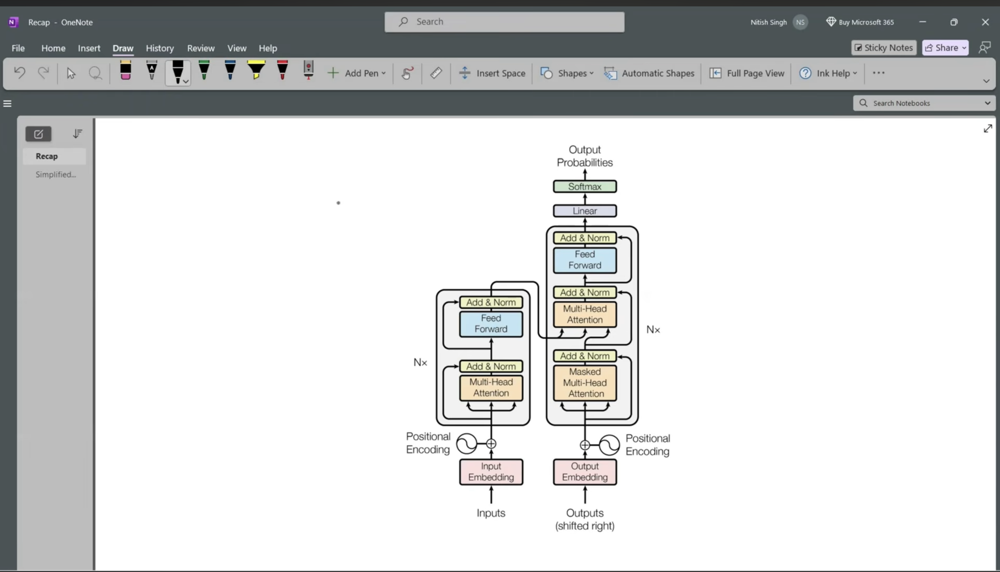



---

## Topic 1: High-Level Overview of the Transformer and Its Encoder

### 1. Introduction
The **Transformer** is a deep learning architecture used primarily for natural language processing (NLP) tasks. It consists of two main parts: an **Encoder** and a **Decoder**. This topic focuses on the **Encoder**, which processes the input text (like a sentence) and converts it into a rich, context-aware numerical representation that the rest of the model can use.

**Why it matters:** The Encoder is the "understanding" half of the Transformer. Without it, the model cannot extract meaning from the input text.

**Real-life use:** The Encoder is used in machine translation (e.g., translating English to French), text summarization, sentiment analysis, and many other NLP tasks where understanding the input is crucial.

---

### 2. Detailed Explanation
 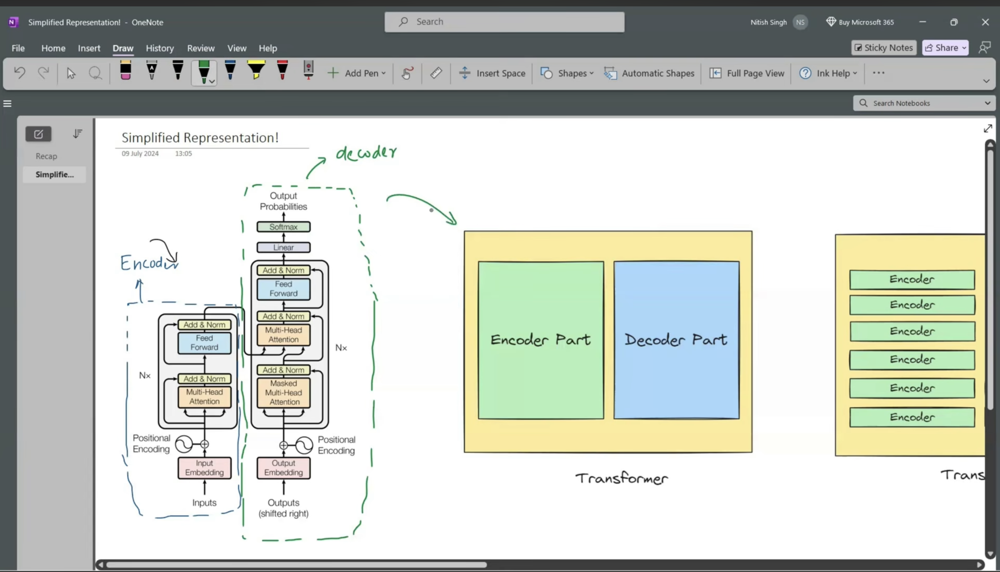
#### A. The Transformer as a Box
- The Transformer can be simplified as a **large box** that contains two smaller boxes:
  - **Encoder box**
  - **Decoder box**
- This is the simplest way to visualize the architecture.

#### B. Multiple Identical Blocks
- Inside the Encoder box, there are **multiple identical blocks** (also called layers).
- In the original Transformer paper ("Attention Is All You Need"), **6 encoder blocks** are used. This number was found experimentally to give the best results.
- All encoder blocks have the **same architecture** (they are "identical"), but they have **different parameters** (weights and biases). They are not shared.
- If you understand **one** encoder block, you understand all of them.

#### C. Inside a Single Encoder Block
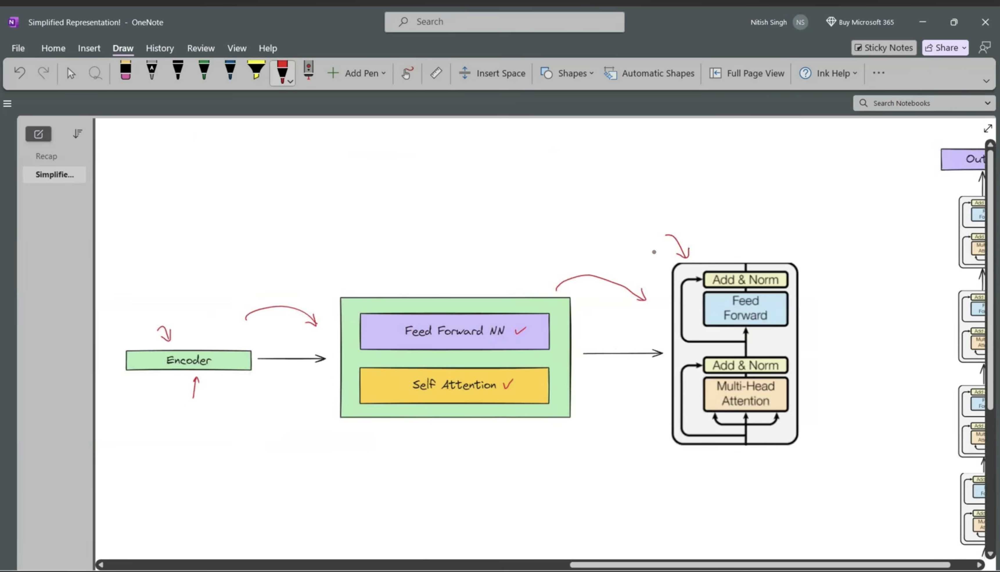
Each encoder block contains **two main sub-layers**:

1. **Multi-Head Self-Attention** – allows the model to focus on different parts of the input sentence and understand context.
2. **Feed-Forward Neural Network (FFNN)** – processes the attention output further.

In addition, each sub-layer has:
- A **residual (skip) connection** around it.
- An **Add & Normalization** step after the residual connection.

So, inside each encoder block, the flow is:
```
Input → Multi-Head Attention → Add & Norm → Feed-Forward → Add & Norm → Output (to next block)
```

#### D. Multiple Encoder Blocks in Sequence
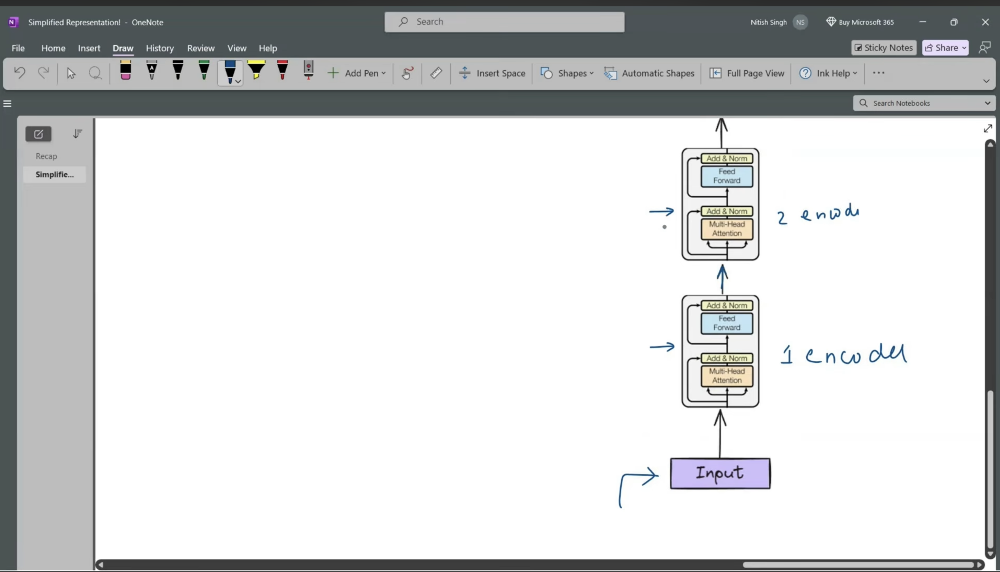
- The output of the first encoder block becomes the input to the second, the output of the second becomes the input to the third, and so on, for all 6 blocks.
- The final output of the 6th encoder block is sent to the **Decoder**.

---

### 3. Key Points
- Transformer = Encoder + Decoder.
- Encoder has **multiple identical blocks** (6 in the original paper).
- Each encoder block has:
  - Multi-Head Self-Attention
  - Feed-Forward Neural Network
  - Residual connections and normalization after each sub-layer.
- All blocks have the same structure but different learned parameters.
- The Encoder’s job is to convert input text into meaningful, context-rich numerical vectors.

---

### 4. Common Mistakes
- **Mistake:** Thinking all encoder blocks share the same weights.
  - **Correction:** They have the same architecture, but each block learns its own weights during training.
- **Mistake:** Confusing the entire Encoder with a single encoder block.
  - **Correction:** The Encoder is a stack of multiple blocks; a single block is just one layer in that stack.

---

### 5. Interview/Exam Questions
**Q1:** What are the two main components inside a Transformer Encoder block?  
**A1:** Multi-Head Self-Attention and a Feed-Forward Neural Network.

**Q2:** How many encoder blocks are used in the original Transformer paper, and why?  
**A2:** Six. This number was chosen through experimentation because it gave the best results.

**Q3:** Are all encoder blocks identical in terms of their parameters?  
**A3:** No. They have identical architecture but different parameters (weights and biases).

---

### 6. Revision Notes
- Transformer = Encoder + Decoder.
- Encoder = stack of 6 identical blocks (architecturally).
- Each block = Multi-Head Attention + Feed-Forward Network + residual connections + normalization.
- Each block has its own separate parameters.
- Output of final encoder block goes to the Decoder.

---



## Topic 2: Input Preparation – Tokenization, Embedding, and Positional Encoding

### 1. Introduction
Before any text enters the actual encoder blocks, it must go through a preprocessing stage called the **Input Block**. Raw text (like the sentence "how are you") cannot be fed directly into a neural network because machines understand numbers, not words.

The Input Block performs **three critical operations**:
1. **Tokenization** – splitting text into smaller pieces (tokens).
2. **Embedding (Text Vectorization)** – converting each token into a numerical vector.
3. **Positional Encoding** – adding information about the order/position of each token in the sentence.

**Why it matters:** Without these steps, the encoder would receive meaningless data and could not learn anything. Positional encoding, in particular, is essential because attention mechanisms are "order-blind" – they treat all input positions equally unless we explicitly tell them the sequence order.

**Real-life use:** Every NLP model (GPT, BERT, etc.) uses some form of tokenization, embedding, and positional encoding to prepare raw text for processing.

---

### 2. Detailed Explanation
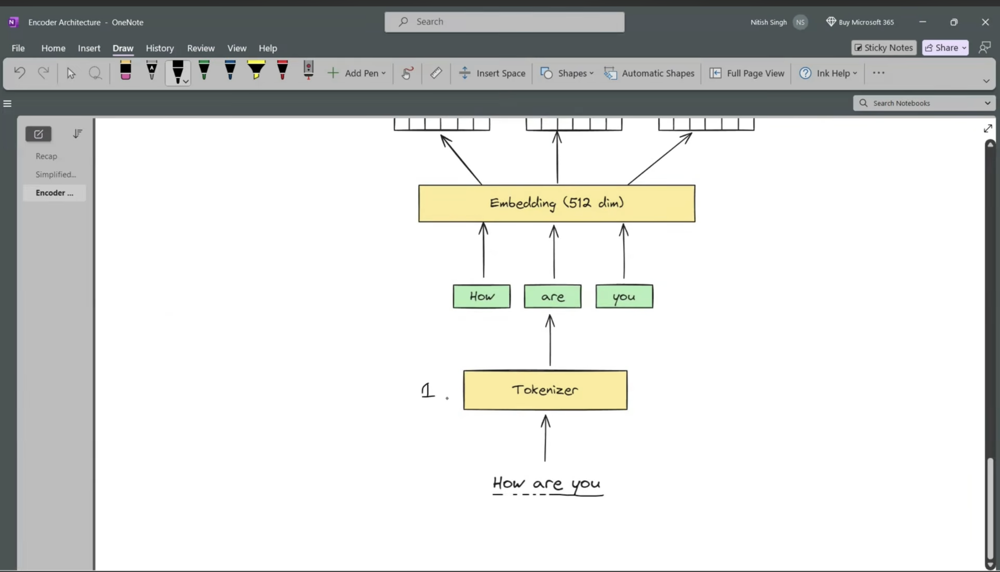
#### Step 1: Tokenization
- Tokenization means breaking a sentence into smaller units called **tokens**.
- In this example, **word-level tokenization** is used, so each word becomes a separate token.
- Example sentence: `"how are you"`
  - Tokens: `["how", "are", "you"]`
- Tokens can also be subwords or characters in other approaches, but the concept is the same.

#### Step 2: Embedding (Text Vectorization)
- A neural network cannot process words directly; they must be converted to numbers.
- This is done using an **embedding layer**.
- Each token is mapped to a **dense vector** of fixed size. In this example, the vector size is **512 dimensions**.
- So:
  - `"how"` → a vector of 512 numbers
  - `"are"` → a vector of 512 numbers
  - `"you"` → a vector of 512 numbers
- These vectors are called **embedding vectors**.

#### Step 3: Positional Encoding
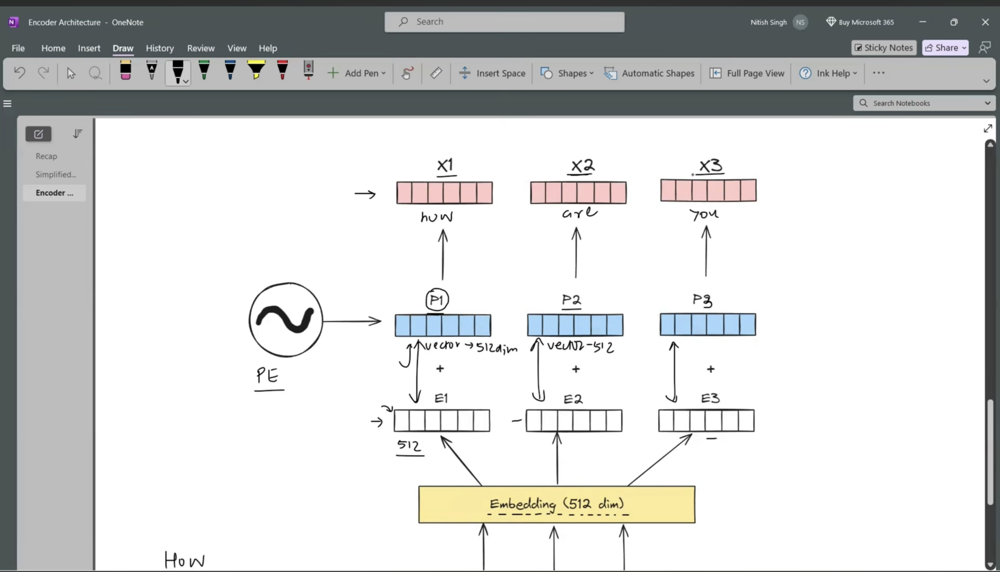
- The attention mechanism (which we will see later) does **not** know the order of words. It treats all positions the same.
- To fix this, we add **positional information** to each embedding.
- A positional encoding vector is generated for each position (position 1, position 2, position 3, etc.). Each such vector also has **512 dimensions**.
- Then we **add** the embedding vector and the positional encoding vector element-wise.
- Example:
  - `embedding("how") + positional_encoding(position 1) = x1`
  - `embedding("are") + positional_encoding(position 2) = x2`
  - `embedding("you") + positional_encoding(position 3) = x3`
- The resulting vectors `x1, x2, x3` are the final **input vectors** that enter the first encoder block.

#### Important Observation
- Throughout the Input Block, the **dimension remains 512** for every token.
- Input: 3 tokens → Output: 3 vectors, each of size 512.

---

### 3. Key Points
- **Tokenization:** Breaks text into tokens (words, subwords, or characters).
- **Embedding:** Converts each token into a fixed-size numerical vector (512 dimensions in this example).
- **Positional Encoding:** Adds position-specific vectors to embeddings so the model knows word order.
- The final output of the Input Block is a set of vectors (one per token), all of the same dimension (512).

---

### 4. Common Mistakes
- **Mistake:** Thinking that embeddings already contain positional information.
  - **Correction:** They do not. Positional encoding is added separately.
- **Mistake:** Confusing tokenization with embedding.
  - **Correction:** Tokenization splits text; embedding converts tokens to numbers. They are two distinct steps.
- **Mistake:** Forgetting that positional encoding is **added** to the embedding, not concatenated.
  - **Correction:** The vectors are added element-wise, so the dimension remains the same (512).

---

### 5. Interview/Exam Questions
**Q1:** What three operations are performed on the input sentence before it enters the first encoder block?  
**A1:** Tokenization, embedding (text vectorization), and positional encoding.

**Q2:** Why is positional encoding necessary in the Transformer?  
**A2:** Because the self-attention mechanism does not naturally capture the order of tokens. Positional encoding explicitly adds order information.

**Q3:** If the embedding vector is 512-dimensional, what is the dimension of the positional encoding vector, and how are they combined?  
**A3:** The positional encoding vector is also 512-dimensional. They are combined by element-wise addition.

---

### 6. Revision Notes
- Input Block = Tokenization → Embedding → Positional Encoding.
- Tokenization: `"how are you"` → `["how", "are", "you"]`.
- Embedding: each token → 512-dim vector.
- Positional Encoding: 512-dim vector per position, added to embedding.
- Final input to encoder: 3 vectors (x1, x2, x3), each 512-dim.

---



## Topic 3: Inside the Encoder Block – Multi-Head Attention & Add & Norm (First Sublayer)

### 1. Introduction
Now that the input vectors (x1, x2, x3) have been prepared, they enter the first encoder block. The first major operation inside the block is **Multi-Head Self-Attention**, followed by a **residual connection** and **layer normalization** (collectively called "Add & Norm").

**Why it matters:** The embedding vectors we created earlier are **context-free** – the word "bank" has the same embedding whether it appears in "money bank" or "river bank". Multi-head attention solves this by looking at surrounding words and creating **context-aware** embeddings. This is the core reason Transformers are so powerful.

**Real-life use:** Whenever you use a modern search engine, translation tool, or voice assistant, context-aware embeddings help the system understand what you *mean*, not just what you *say*.

---

### 2. Detailed Explanation

#### A. What Happens in Multi-Head Attention?
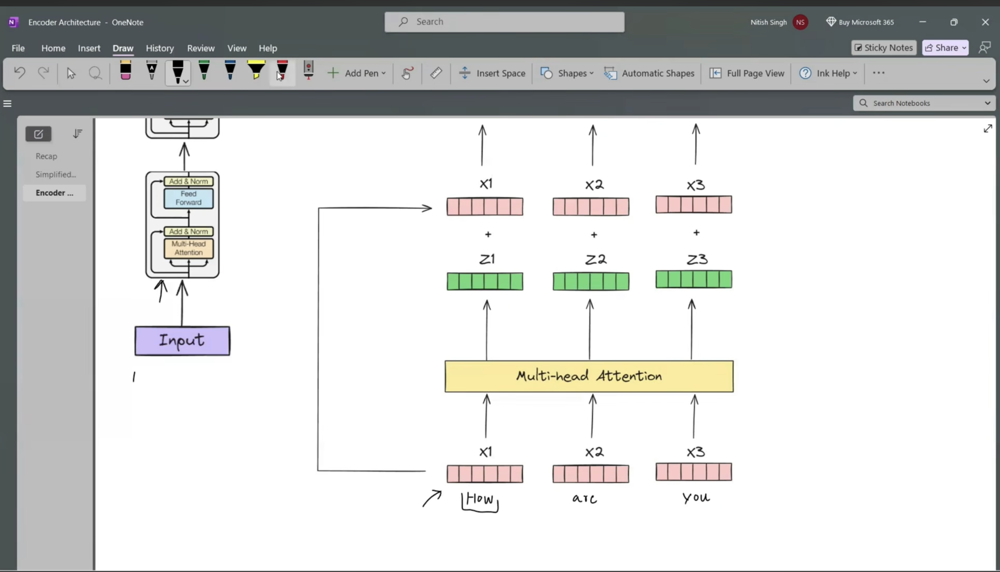
- The three input vectors (x1, x2, x3) – each of size 512 – are fed into the Multi-Head Attention block.
- Multi-Head Attention is essentially **multiple self-attention mechanisms running in parallel** (like asking multiple experts for their opinion).
- Self-attention allows each word to "look at" all other words in the sentence and decide how much attention to pay to each one.
- The output of Multi-Head Attention is a **new set of vectors**:
  - x1 → z1
  - x2 → z2
  - x3 → z3
- Importantly, each z vector is still **512-dimensional**. The dimension does not change.
- But now, z1 (for "how") contains information from "are" and "you" as well – it is **contextually aware**.

#### B. The Residual Connection (Skip Connection)
- Before the input x1, x2, x3 entered Multi-Head Attention, a **copy** of them was saved.
- After Multi-Head Attention produces z1, z2, z3, this saved copy is brought forward via a **residual (skip) connection**.
- So at this point, we have **two sets** of vectors:
  - The original inputs: x1, x2, x3
  - The attention outputs: z1, z2, z3
- We then **add** them element-wise:
  - z1' = x1 + z1
  - z2' = x2 + z2
  - z3' = x3 + z3
- This addition is the "Add" part of "Add & Norm".

#### C. Layer Normalization (The "Norm" Part)
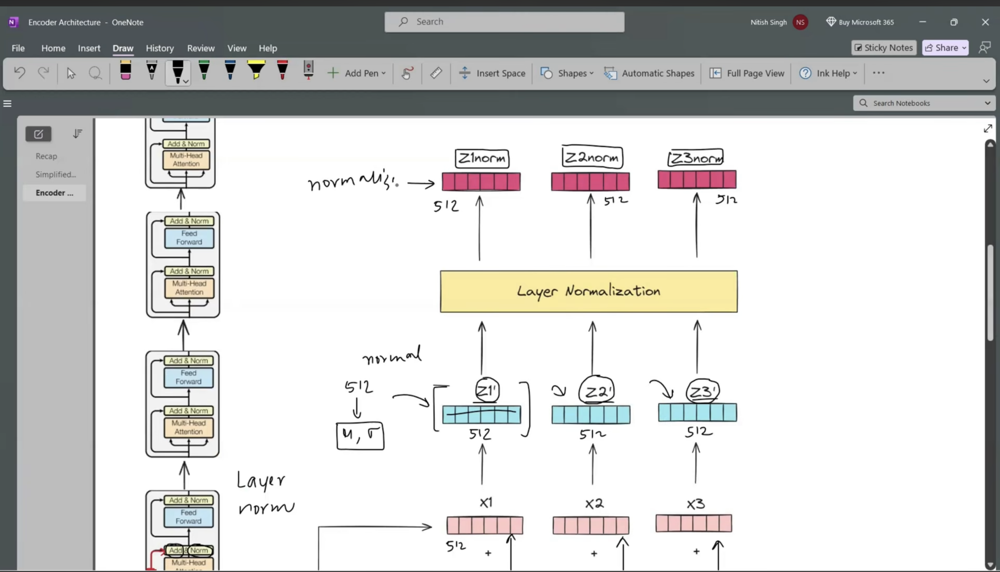
- Now we apply **Layer Normalization** to each of these new vectors (z1', z2', z3').
- Layer Normalization takes one vector (with 512 numbers), calculates its **mean** and **standard deviation**, and then normalizes the values so they fall within a small, stable range.
- This helps stabilize training and prevents numbers from growing too large.
- The output after normalization is:
  - z1'_norm (or simply z1_norm)
  - z2'_norm
  - z3'_norm
- These are also 512-dimensional.

#### D. Why Do We Need Residual Connections?
- Residual connections provide a "shortcut" for gradients during backpropagation, preventing them from vanishing in deep networks.
- They also allow the model to "fall back" on the original features if the attention transformation does not help.
- Even if Multi-Head Attention produces poor results, the original input is still available downstream.

#### E. Why Do We Need Layer Normalization?
- The outputs of Multi-Head Attention can have values in a very large or unpredictable range.
- Neural networks train more stably when values are in a controlled, small range.
- Layer Normalization brings the values back into a stable range.

---

### 3. Key Points
- Multi-Head Attention creates **context-aware** embeddings.
- Residual connection adds the **original input** back to the attention output.
- Layer Normalization stabilizes the values of the resulting vectors.
- All vectors remain **512-dimensional** throughout these operations.
- The output of this sublayer is: z1_norm, z2_norm, z3_norm.

---

### 4. Common Mistakes
- **Mistake:** Thinking Multi-Head Attention changes the vector dimension.
  - **Correction:** It keeps the dimension the same (512).
- **Mistake:** Forgetting that residual connection uses the **original input** before attention, not the output.
  - **Correction:** The residual path is taken *before* entering attention and bypasses it entirely.
- **Mistake:** Confusing Layer Normalization with Batch Normalization.
  - **Correction:** Layer Normalization normalizes across the features of a *single sample*, not across a batch.

---

### 5. Interview/Exam Questions
**Q1:** What is the purpose of Multi-Head Self-Attention in the encoder?  
**A1:** To create context-aware embeddings by allowing each word to attend to all other words in the sentence.

**Q2:** What two operations are performed in "Add & Norm"?  
**A2:** First, a residual connection (adding the original input to the output of the sublayer). Second, Layer Normalization.

**Q3:** Why are residual connections important in the Transformer?  
**A3:** They help prevent vanishing gradients in deep networks and allow the model to keep original features if a transformation is harmful.

**Q4:** Why is Layer Normalization applied after the residual addition?  
**A4:** To stabilize the values and keep them within a small range, which makes training more stable.

---

### 6. Revision Notes
- First sublayer of encoder block:
  1. Input (x) → Multi-Head Attention → Output (z)
  2. Add residual: z' = x + z
  3. Layer Normalize: z'_norm = Norm(z')
- Everything stays 512-dimensional.
- Output = context-aware, normalized vectors.

---



## Topic 4: Inside the Encoder Block – Feed-Forward Neural Network & Second Add & Norm

### 1. Introduction
After the Multi-Head Attention sublayer, the vectors (now context-aware and normalized) pass through the second major component of the encoder block: a **Feed-Forward Neural Network (FFNN)**. This is followed by another **residual connection** and **Layer Normalization** (the second "Add & Norm" step).

**Why it matters:** The FFNN introduces **non-linearity** into the model. While attention is powerful, it is essentially a linear operation. The FFNN allows the model to learn more complex patterns and relationships in the data that attention alone cannot capture.

**Real-life use:** In practice, the FFNN is what gives the Transformer its "deep learning" edge. It processes the context-aware vectors and transforms them into a richer representation, which is crucial for tasks like translation, question answering, and text generation.

---

### 2. Detailed Explanation
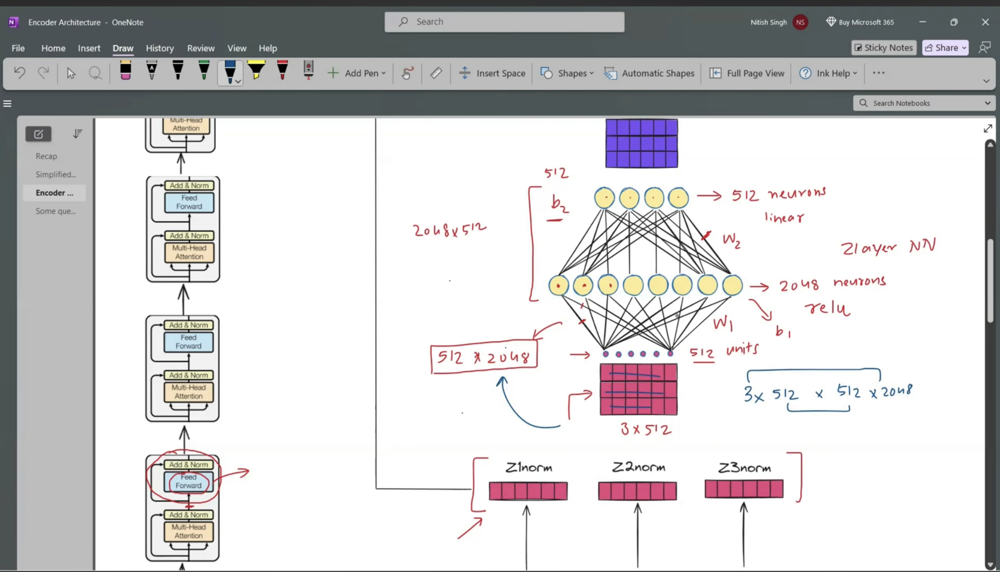
#### A. Architecture of the Feed-Forward Neural Network
The FFNN inside each encoder block has a very specific structure:

- **Input layer:** 512 neurons (accepts the 512-dimensional vectors).
- **Hidden layer:** 2048 neurons with **ReLU activation**.
- **Output layer:** 512 neurons with **linear activation** (no activation function).

So the network is:
```
Input (512) → Dense(2048, ReLU) → Dense(512, Linear)
```

**Parameters:**
- **First layer:** Weight matrix W1 (size 512 × 2048), bias b1 (size 2048).
- **Second layer:** Weight matrix W2 (size 2048 × 512), bias b2 (size 512).

**Key point:** The FFNN is applied **independently to each position/vector**. It does not mix information across different tokens – each token's vector is processed separately.

#### B. How the Data Flows Through the FFNN
- The normalized vectors from the first sublayer (call them `z1_norm`, `z2_norm`, `z3_norm`) are stacked into a matrix of shape **(3 × 512)**.
- This matrix enters the FFNN.

**Step 1: First Linear Layer + ReLU**
```
h = ReLU( (z_norm) · W1 + b1 )
```
- `z_norm` is (3 × 512), W1 is (512 × 2048) → result is (3 × 2048).
- This **increases** the dimension from 512 to 2048.
- ReLU introduces non-linearity by setting negative values to zero.

**Step 2: Second Linear Layer (Output)**
```
y = h · W2 + b2
```
- `h` is (3 × 2048), W2 is (2048 × 512) → result is (3 × 512).
- This **reduces** the dimension back to 512.
- Linear activation means no non-linearity is applied at the output.

#### C. Why Increase and Then Decrease the Dimension?
- The first layer **expands** the representation (from 512 to 2048), giving the network more "room" to learn complex patterns.
- The ReLU activation adds **non-linearity**, which is essential for learning non-linear relationships.
- The second layer **compresses** the representation back to 512, keeping the dimension consistent for the rest of the model.
- The benefit is not in changing the size, but in applying **non-linear transformations** that the attention mechanism cannot provide.

#### D. Second Residual Connection and Layer Normalization
- Just like before, we take a copy of the **input** to the FFNN (which was `z1_norm, z2_norm, z3_norm`) and bring it forward via a residual connection.
- The FFNN outputs are `y1, y2, y3`.
- We **add** them:
  - `y1' = z1_norm + y1`
  - `y2' = z2_norm + y2`
  - `y3' = z3_norm + y3`
- Then we apply **Layer Normalization** to each `y'` vector:
  - `y1_norm = Norm(y1')`
  - `y2_norm = Norm(y2')`
  - `y3_norm = Norm(y3')`
- The final output of the encoder block is `y1_norm, y2_norm, y3_norm` – each still 512-dimensional.

---

### 3. Key Points
- The FFNN has two layers: 512 → 2048 (ReLU) → 512 (Linear).
- It is applied **position-wise** (independently to each token's vector).
- The dimension expansion allows the network to learn more complex patterns.
- ReLU introduces non-linearity.
- A second residual connection and Layer Normalization are applied after the FFNN.
- The output dimension remains 512 throughout.

---

### 4. Common Mistakes
- **Mistake:** Thinking the FFNN mixes information across tokens.
  - **Correction:** It processes each token's vector independently. Information mixing is done only by the attention mechanism.
- **Mistake:** Confusing the FFNN's hidden size (2048) with the model dimension (512).
  - **Correction:** 2048 is the inner expansion size; 512 is the input/output size.
- **Mistake:** Forgetting that the second residual connection uses the **input to the FFNN**, not the output of the first Add & Norm.
  - **Correction:** The residual path bypasses the FFNN entirely, taking `z_norm` directly to the addition.

---

### 5. Interview/Exam Questions
**Q1:** What is the architecture of the Feed-Forward Neural Network inside a Transformer encoder block?  
**A1:** It has two linear layers: the first expands from 512 to 2048 neurons with ReLU activation, and the second reduces from 2048 back to 512 with linear activation.

**Q2:** Why does the FFNN first increase the dimension from 512 to 2048 and then decrease it back?  
**A2:** The expansion provides more capacity to learn complex patterns, and the ReLU activation adds non-linearity. The reduction brings it back to the model dimension for consistency.

**Q3:** Does the FFNN process all tokens together or separately?  
**A3:** It processes each token's vector independently (position-wise). There is no cross-token interaction in the FFNN.

**Q4:** What is the purpose of the second residual connection and normalization?  
**A4:** Same as the first – to stabilize training, prevent vanishing gradients, and allow the model to retain original features if needed.

---

### 6. Revision Notes
- FFNN = 512 → 2048 (ReLU) → 512 (Linear).
- Applied independently to each token.
- First layer increases dimension; ReLU adds non-linearity.
- Second layer reduces dimension back to 512.
- Residual connection adds input of FFNN to its output.
- Layer Normalization applied after addition.
- Output = normalized vectors, still 512-dim.

---


## Topic 5: Stacking Encoder Blocks, Parameter Differences, and Overall Flow Summary

### 1. Introduction
We have now understood what happens inside a **single** encoder block: Multi-Head Attention → Add & Norm → Feed-Forward → Add & Norm. But the Transformer encoder does not stop there. It stacks **multiple such blocks** (six in the original paper) one after another. This topic explains how these blocks work together, how they differ from each other, and gives a complete summary of the entire encoder's data flow.

**Why it matters:** The power of deep learning comes from **depth** – stacking many layers allows the model to learn increasingly abstract and complex representations of language. Each encoder block builds upon the previous one, refining the contextual understanding step by step.

**Real-life use:** Modern large language models (like GPT, BERT, Llama) use dozens or even hundreds of such stacked layers. Understanding the stacking principle is fundamental to understanding how these models scale.

---

### 2. Detailed Explanation

#### A. How the Blocks Are Stacked
- The output of the **first** encoder block (which we called `y1_norm, y2_norm, y3_norm`) becomes the **input** to the **second** encoder block.
- The second block has the **exact same architecture** as the first.
- It processes the vectors through its own Multi-Head Attention, Add & Norm, FFNN, and Add & Norm.
- The output of the second block becomes the input to the third, and so on.
- This continues until we reach the **sixth** (and final) encoder block.

#### B. Important: Parameters Are NOT Shared
- Although all six encoder blocks have the **same architecture**, they do **not** share the same parameters (weights and biases).
- Each block has its **own** set of W1, b1, W2, b2 for its FFNN, and its own attention weight matrices.
- These parameters are learned independently during training via backpropagation.
- So block 1 might learn to focus on syntax, block 2 on semantics, block 3 on relationships, etc., depending on what the training data requires.

#### C. Dimensions Never Change
- At every stage – input, after attention, after FFNN, after each Add & Norm – the vectors remain **512-dimensional**.
- For a sentence with 3 tokens, the shape remains **(3 × 512)** from start to finish of the encoder.
- The only thing that changes is the **content** of the vectors: they become increasingly context-rich and refined as they pass through successive blocks.

#### D. Complete Data Flow Summary (Full Encoder)

Let's trace the entire journey of the sentence `"how are you"` from raw text to the final encoder output:

| Step | Operation | Input | Output | Shape |
|------|-----------|-------|--------|-------|
| 1 | Tokenization | "how are you" | ["how", "are", "you"] | 3 tokens |
| 2 | Embedding | Each token | 3 vectors (512-dim each) | 3 × 512 |
| 3 | Positional Encoding (add) | 3 vectors + position vectors | x1, x2, x3 | 3 × 512 |
| 4 | Encoder Block 1 | x1, x2, x3 | y1_norm, y2_norm, y3_norm | 3 × 512 |
| 5 | Encoder Block 2 | y1_norm, y2_norm, y3_norm | (new outputs) | 3 × 512 |
| 6 | Encoder Block 3 | ... | ... | 3 × 512 |
| 7 | Encoder Block 4 | ... | ... | 3 × 512 |
| 8 | Encoder Block 5 | ... | ... | 3 × 512 |
| 9 | Encoder Block 6 | ... | Final encoder output | 3 × 512 |
| 10 | Final step | Final output sent to **Decoder** | – | – |

#### E. Why Stack Multiple Blocks?
- **Representation power:** Language is complex. One block is not enough to capture all the nuances.
- **Deeper understanding:** Each layer can learn different levels of abstraction – from word meanings to phrase structures to whole-sentence semantics.
- **Deep learning philosophy:** The word "deep" in deep learning refers precisely to stacking many layers to extract increasingly hidden patterns from data.

**Why exactly six?**
- The original authors tried different numbers and found that **six** gave the best performance for their tasks.
- This number is **not fixed**. Different Transformer variants use different numbers (e.g., BERT uses 12, GPT-3 uses 96).
- It is a **hyperparameter** that can be tuned based on the application and available data.

---

### 3. Key Points
- Encoder = stack of **multiple identical blocks** (six in the original paper).
- Each block has the **same architecture** but **different parameters**.
- The vector dimension **(512)** remains constant throughout all blocks.
- Each block progressively refines the contextual representation.
- The final encoder output is sent to the **Decoder**.
- Stacking more blocks increases the model's representation power.

---

### 4. Common Mistakes
- **Mistake:** Assuming all encoder blocks share the same weights.
  - **Correction:** They have identical architectures but are trained with separate parameters.
- **Mistake:** Thinking the dimension changes somewhere inside the encoder.
  - **Correction:** The dimension stays 512 from input to output of the entire encoder.
- **Mistake:** Believing six blocks is a fixed rule for all Transformers.
  - **Correction:** Six is the number used in the original paper; it can vary in other implementations.

---

### 5. Interview/Exam Questions
**Q1:** How many encoder blocks are in the original Transformer, and are their parameters shared?  
**A1:** Six blocks. They have identical architecture but **different** (not shared) parameters.

**Q2:** What is the shape of the data at the input of the first encoder block and at the output of the last encoder block?  
**A2:** Both are the same shape. For a sentence with 3 tokens, it is 3 × 512.

**Q3:** Why is it beneficial to stack multiple encoder blocks?  
**A3:** Stacking allows the model to learn deeper, more abstract representations of language, capturing complex patterns that a single layer cannot.

**Q4:** Can the number of encoder blocks be changed?  
**A4:** Yes. Six is the original choice, but it is a hyperparameter that can be adjusted based on the task and dataset.

---

### 6. Revision Notes
- Encoder = 6 blocks stacked sequentially.
- Same architecture, different parameters per block.
- Shape: always (num_tokens × 512).
- Output of block N → input of block N+1.
- Final output → goes to Decoder.
- Stacking = more representation power = deeper understanding.

---



## Topic 6: Open Questions and Discussion – Why Residual Connections, FFNN, and 6 Blocks?

### 1. Introduction
The transcript ends with a discussion of three important questions that often arise when studying the Transformer encoder. The instructor explicitly admits that **clear, definitive answers are not fully known** – some are based on common understanding, others are areas of active research. This topic covers those discussions to give you a complete picture of what is known and what remains uncertain.

**Why it matters:** Understanding the *limitations* of our knowledge is as important as understanding the facts. It shows you that machine learning is an evolving field, and not everything is settled. This also prepares you for research-level thinking.

---

### 2. Detailed Explanation

#### Question 1: Why are residual connections used in the encoder?

**Commonly accepted reasons:**

**Reason A – Stable training (prevents vanishing gradients):**
- In very deep neural networks (like Transformers with 6+ layers), gradients can become extremely small during backpropagation, making it hard to update early layers.
- Residual connections provide a **shortcut path** for gradients to flow directly backward, bypassing the complex transformations.
- This keeps gradients large enough to effectively update parameters.

**Reason B – Preserve original features:**
- The residual connection allows the original input to "skip" the sublayer.
- If the sublayer (attention or FFNN) produces a **harmful** transformation, the model can still use the original features directly.
- It acts like an "identity operation" – if a transformation does not help, you can ignore it and fall back on the original.

**Instructor's note:**
- The original Transformer paper **does not explicitly explain** why residual connections are used.
- The instructor shares an anecdote: someone coded the Transformer without residual connections and got poor performance; adding them restored performance. This proves they are **important**, even if the exact reason is debated.

---

#### Question 2: Why use a Feed-Forward Neural Network after Multi-Head Attention?

**Commonly accepted reason – Capturing non-linearity:**
- Multi-Head Attention is a **linear** operation (matrix multiplications, softmax, weighted sums).
- Real-world language data contains **non-linear** patterns and complexities.
- The FFNN (with ReLU activation) introduces **non-linearity**, allowing the model to learn these more complex relationships.

**Alternative perspective (from a research paper):**
- A paper titled *"Transformer Feed-Forward Layers Are Key-Value Memories"* suggests another view:
  - FFNN layers act like **key-value memory stores**.
  - Each "key" in the FFNN correlates with patterns in training data.
  - Each "value" induces a distribution over the output vocabulary.
- This is a **different interpretation** and shows that research is still ongoing.

**Instructor's note:**
- Even this question does not have a single, universally accepted answer.
- The paper acknowledges that the role of FFNNs in Transformers "remains under-explained."

---

#### Question 3: Why use six encoder blocks? Why not one or ten?

**Clear answer – Need for representation power:**
- Language is complex and difficult to understand.
- A single encoder block does not provide enough **representation power** to capture all the nuances.
- Stacking multiple layers allows the model to build **deeper, more abstract** representations.
- This follows the core philosophy of deep learning: more layers → better feature extraction.

**Why exactly six?**
- The original authors experimented and found that **six** gave the best results for their tasks.
- This is a **hyperparameter**, not a fixed law.
- Different Transformer variants use different numbers:
  - BERT uses 12 encoder layers.
  - GPT-3 uses 96 layers.
- You can adjust this number based on your dataset, computational resources, and task.

**Key takeaway:** The number 6 is empirical, not theoretical.

---

### 3. Key Points
- **Residual connections:** Help with stable training (gradient flow) and preserve original features.
- **FFNN:** Introduces non-linearity that attention lacks; may also act as a key-value memory (research area).
- **6 blocks:** Chosen empirically; more blocks increase representation power; number can vary.
- **Important:** Some design choices in Transformers are not fully explained – they are areas of active research.

---

### 4. Common Mistakes
- **Mistake:** Believing there is a single, proven reason for every component in the Transformer.
  - **Correction:** Some reasons are speculative or based on intuition; the field is still evolving.
- **Mistake:** Thinking the number of encoder blocks is fixed at 6 for all applications.
  - **Correction:** It is a hyperparameter and can be tuned.
- **Mistake:** Assuming Multi-Head Attention is non-linear.
  - **Correction:** Attention is largely linear; the FFNN provides the non-linearity.

---

### 5. Interview/Exam Questions
**Q1:** Why are residual connections used in the Transformer encoder?  
**A1:** To prevent vanishing gradients in deep networks and to allow the model to retain original features if transformations are harmful.

**Q2:** What is the role of the Feed-Forward Neural Network in the encoder?  
**A2:** It introduces non-linearity (via ReLU) to capture complex patterns that linear attention cannot. Some research also suggests it acts as a key-value memory.

**Q3:** Why did the original Transformer use 6 encoder blocks?  
**A3:** It was chosen empirically because it gave the best results. More blocks increase representation power, but the number is a hyperparameter that can vary.

**Q4:** Are all design choices in the Transformer fully understood?  
**A4:** No. Some components (like the exact role of FFNNs and residual connections) are still areas of active research and debate.

---

### 6. Revision Notes
- Residual connections → stable training + feature preservation.
- FFNN → non-linearity (and possibly key-value memory).
- 6 blocks → empirical choice; deep stacking for better representation.
- Not everything is fully explained – Transformers are still an active research area.

---

**This concludes all topics from the transcript. You have now covered the entire Encoder Architecture of the Transformer as discussed in the video.**
